<h1><b>Customer Segmentation for Airline Loyalty Program Optimization</b></h1> 

Enhancing Airline Loyalty Programs with RFM Analysis and K-Means Clustering

<h2><u>Use Case</u></h2>

<p align="justify"> The airline industry operates in a highly competitive environment where retaining customers and ensuring their loyalty is crucial for sustainable growth. Airlines often offer loyalty programs to incentivize repeat business and cultivate a loyal customer base. However, with an abundance of customer data available, airlines face the challenge of effectively segmenting their customers to tailor marketing strategies and enhance customer experiences.</p>

<h3>Objective</h3>
<j>To identify distinct customer segments within the airline's loyalty program based on their flight booking behavior, loyalty engagement, and demographic characteristics. 

<br>This segmentation will inform the development of targeted marketing strategies and personalized loyalty program offerings to maximize customer engagement and retention.

<h3>Challenge</h3>
<j>Airlines face intense competition, making it crucial to understand their customer base and tailor offerings accordingly. Traditional segmentation based on demographics often falls short, failing to capture the diverse needs and behaviors of loyalty program members.</j>

<h3>Business Benefits</h3>

1. **Improved Marketing Strategies** - Targeted marketing campaigns tailored to the preferences and behaviors of specific customer segments
2. **Enhanced Loyalty Program** - Optimization of loyalty program offerings based on the distinct needs of each segment
3. **Improved Customer Retention** - Focusing loyalty program benefits on the needs and preferences of different customer segments can lead to increased customer satisfaction and loyalty.
4. **Revenue Growth** - Targeted offers to high-value segments can incentivize increased spending, while appropriate offerings to less frequent flyers can encourage them to travel more.

## Table of Contents<a name="TOC"></a>

1. [Data Preprocessing](#Section1)
<br>Data cleaning</br>

2. [Data Visualization & Analysis](#Section2)
<br>Analysis and data visualization</br>

3. [Feature Selection](#Section3)
<br>Selecting the best features for modelling</br>

4. [Model Generation & Evaluation](#Section4)
<br>Building Cluster Modelling using **K-Means Clustering** and evaluating its performance</br>

6. [Summary](#Section6)
<br>Key takeaways & business recommendations</br>

**Importing libraries & dataset**

In [1]:
#import libraries

import warnings
warnings.filterwarnings('ignore')

# Data Manipulation
import pandas as pd
import numpy as np
import seaborn as sns
import statistics

# Data Visualization
import matplotlib.pyplot as plt
import plotly.express as px    #module for graphs
import seaborn as sns
sns.set()
sns.set_theme(style='whitegrid', palette='muted')

# Date
from datetime import date

# Machine Learning
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer  # module for feature selection & evaluation

In [2]:
#import flight dataset
flight_df = pd.read_csv('Customer Flight Activity.csv')
print("Customer Flight Activity")

display(flight_df)

Customer Flight Activity


,Loyalty Number,Year,Month,Flights Booked,Flights with Companions,Total Flights,Distance,Points Accumulated,Points Redeemed,Dollar Cost Points Redeemed
0,100018,2017,1,3,0,3,1521,152.0,0,0
1,100102,2017,1,10,4,14,2030,203.0,0,0
2,100140,2017,1,6,0,6,1200,120.0,0,0
3,100214,2017,1,0,0,0,0,0.0,0,0
4,100272,2017,1,0,0,0,0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...
405619,999902,2018,12,0,0,0,0,0.0,0,0
405620,999911,2018,12,0,0,0,0,0.0,0,0
405621,999940,2018,12,3,0,3,1233,123.0,0,0
405622,999982,2018,12,0,0,0,0,0.0,0,0


In [3]:
#import loyalty dataset
loyalty_df = pd.read_csv('Customer Loyalty History.csv')
print("Customer Loyalty History")

display(loyalty_df)

Customer Loyalty History


,Loyalty Number,Country,Province,City,Postal Code,Gender,Education,Salary,Marital Status,Loyalty Card,CLV,Enrollment Type,Enrollment Year,Enrollment Month,Cancellation Year,Cancellation Month
0,480934,Canada,Ontario,Toronto,M2Z 4K1,Female,Bachelor,83236.0,Married,Star,3839.14,Standard,2016,2,NaN,NaN
1,549612,Canada,Alberta,Edmonton,T3G 6Y6,Male,College,NaN,Divorced,Star,3839.61,Standard,2016,3,NaN,NaN
2,429460,Canada,British Columbia,Vancouver,V6E 3D9,Male,College,NaN,Single,Star,3839.75,Standard,2014,7,2018.0,1.0
3,608370,Canada,Ontario,Toronto,P1W 1K4,Male,College,NaN,Single,Star,3839.75,Standard,2013,2,NaN,NaN
4,530508,Canada,Quebec,Hull,J8Y 3Z5,Male,Bachelor,103495.0,Married,Star,3842.79,Standard,2014,10,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16732,823768,Canada,British Columbia,Vancouver,V6E 3Z3,Female,College,NaN,Married,Star,61850.19,Standard,2012,12,NaN,NaN
16733,680886,Canada,Saskatchewan,Regina,S1J 3C5,Female,Bachelor,89210.0,Married,Star,67907.27,Standard,2014,9,NaN,NaN
16734,776187,Canada,British Columbia,Vancouver,V5R 1W3,Male,College,NaN,Single,Star,74228.52,Standard,2014,3,NaN,NaN
16735,906428,Canada,Yukon,Whitehorse,Y2K 6R0,Male,Bachelor,-57297.0,Married,Star,10018.66,2018 Promotion,2018,4,NaN,NaN


## Data Understanding

In [4]:
flight_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 405624 entries, 0 to 405623
Data columns (total 10 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Loyalty Number               405624 non-null  int64  
 1   Year                         405624 non-null  int64  
 2   Month                        405624 non-null  int64  
 3   Flights Booked               405624 non-null  int64  
 4   Flights with Companions      405624 non-null  int64  
 5   Total Flights                405624 non-null  int64  
 6   Distance                     405624 non-null  int64  
 7   Points Accumulated           405624 non-null  float64
 8   Points Redeemed              405624 non-null  int64  
 9   Dollar Cost Points Redeemed  405624 non-null  int64  
dtypes: float64(1), int64(9)
memory usage: 30.9 MB


In [5]:
loyalty_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16737 entries, 0 to 16736
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Loyalty Number      16737 non-null  int64  
 1   Country             16737 non-null  object 
 2   Province            16737 non-null  object 
 3   City                16737 non-null  object 
 4   Postal Code         16737 non-null  object 
 5   Gender              16737 non-null  object 
 6   Education           16737 non-null  object 
 7   Salary              12499 non-null  float64
 8   Marital Status      16737 non-null  object 
 9   Loyalty Card        16737 non-null  object 
 10  CLV                 16737 non-null  float64
 11  Enrollment Type     16737 non-null  object 
 12  Enrollment Year     16737 non-null  int64  
 13  Enrollment Month    16737 non-null  int64  
 14  Cancellation Year   2067 non-null   float64
 15  Cancellation Month  2067 non-null   float64
dtypes: f

As we can see, the rest of the columns are numerical and additive. So, let us group the data on the basis of the `Loyalty Number` by summing the rest of the columns.

From the above information, we can infer that there are 16737 unique loyalty customers.
Since the aim of this code is to collect data on them, let us cluster the data based on the customers only.

## Data Transformation

Join the two dataframes using the column `Loyalty Number`

In [6]:
new_flight = flight_df.groupby('Loyalty Number', as_index = False).sum() 

display(new_flight)

,Loyalty Number,Year,Month,Flights Booked,Flights with Companions,Total Flights,Distance,Points Accumulated,Points Redeemed,Dollar Cost Points Redeemed
0,100018,48420,156,157,35,192,50682,5376.00,1513,123
1,100102,48420,156,173,42,215,40222,4115.25,1195,96
2,100140,48420,156,152,38,190,41252,4184.25,593,48
3,100214,48420,156,79,17,96,33982,3426.00,861,70
4,100272,48420,156,127,36,163,40872,4108.04,1007,82
...,...,...,...,...,...,...,...,...,...,...
16732,999902,48420,156,178,47,225,57227,6056.50,876,71
16733,999911,48420,156,0,0,0,0,0.00,0,0
16734,999940,48420,156,63,23,86,23410,2415.00,672,54
16735,999982,48420,156,22,2,24,5948,594.00,0,0


In [7]:
# Merging both the Customer Loyalty and Customer Flights Dataset based on Loyalty Number column.
airline_df = pd.merge(new_flight, loyalty_df, on='Loyalty Number', how='inner')

display(airline_df)

,Loyalty Number,Year,Month,Flights Booked,Flights with Companions,Total Flights,Distance,Points Accumulated,Points Redeemed,Dollar Cost Points Redeemed,...,Education,Salary,Marital Status,Loyalty Card,CLV,Enrollment Type,Enrollment Year,Enrollment Month,Cancellation Year,Cancellation Month
0,100018,48420,156,157,35,192,50682,5376.00,1513,123,...,Bachelor,92552.0,Married,Aurora,7919.20,Standard,2016,8,NaN,NaN
1,100102,48420,156,173,42,215,40222,4115.25,1195,96,...,College,NaN,Single,Nova,2887.74,Standard,2013,3,NaN,NaN
2,100140,48420,156,152,38,190,41252,4184.25,593,48,...,College,NaN,Divorced,Nova,2838.07,Standard,2016,7,NaN,NaN
3,100214,48420,156,79,17,96,33982,3426.00,861,70,...,Bachelor,63253.0,Married,Star,4170.57,Standard,2015,8,NaN,NaN
4,100272,48420,156,127,36,163,40872,4108.04,1007,82,...,Bachelor,91163.0,Divorced,Star,6622.05,Standard,2014,1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16732,999902,48420,156,178,47,225,57227,6056.50,876,71,...,College,NaN,Married,Aurora,7290.07,Standard,2014,5,NaN,NaN
16733,999911,48420,156,0,0,0,0,0.00,0,0,...,Doctor,217943.0,Single,Nova,8564.77,Standard,2012,8,NaN,NaN
16734,999940,48420,156,63,23,86,23410,2415.00,672,54,...,Bachelor,47670.0,Married,Nova,20266.50,Standard,2017,7,NaN,NaN
16735,999982,48420,156,22,2,24,5948,594.00,0,0,...,College,NaN,Married,Star,2631.56,Standard,2018,7,NaN,NaN


In [8]:
# Create summry data Info
# Find out unique value, number of missing values & datatype of each column (Numerical and Non-Numerical)

list = []

for col in airline_df.columns:
    # Get the top value and its count (using value_counts().idxmax())
    top_value = airline_df[col].value_counts().idxmax()  # Corrected method
    top_count = airline_df[col].value_counts().max()
    list.append([
        col, 
        airline_df[col].dtype, 
        airline_df[col].isna().sum(), 
        100*airline_df[col].isna().sum()/len(airline_df[col]),
        airline_df[col].unique()[0:3], 
        airline_df[col].nunique(),
        top_value,  # Include top values with frequencies
        top_count])
        
    
df_summary = pd.DataFrame(
            data=list, 
            columns=[
            'Feature', 
            'Dtype', 
            'NaN',
            '%NaN',
            'Unique', 
            'Total Unique', 
            'Top', 
            'Frequency']
)

df_summary

,Feature,Dtype,NaN,%NaN,Unique,Total Unique,Top,Frequency
0,Loyalty Number,int64,0,0.000000,"[100018, 100102, 100140]",16737,100018,1
1,Year,int64,0,0.000000,"[48420, 96840, 145260]",3,48420,16574
2,Month,int64,0,0.000000,"[156, 312, 468]",3,156,16574
3,Flights Booked,int64,0,0.000000,"[157, 173, 152]",268,0,1501
4,Flights with Companions,int64,0,0.000000,"[35, 42, 38]",92,0,1822
5,Total Flights,int64,0,0.000000,"[192, 215, 190]",328,0,1501
6,Distance,int64,0,0.000000,"[50682, 40222, 41252]",12714,0,1501
7,Points Accumulated,float64,0,0.000000,"[5376.0, 4115.25, 4184.25]",12081,0.0,1501
8,Points Redeemed,int64,0,0.000000,"[1513, 1195, 593]",2329,0,5177
9,Dollar Cost Points Redeemed,int64,0,0.000000,"[123, 96, 48]",283,0,5177


**Things to connsider**

1. Let's drop the `Country` column since it is redundant (only has 1 unique value = Canada). Plus, we could also drop the `Province` and `Postal Code` columns as we will be working with the more varied `City` column for better clustering.

2. We can drop the `Dollar Cost Points Redeemed` column too as we're more interested in the loyalty points themselves rather than their dollar equivalent.

## Univariate Analysis

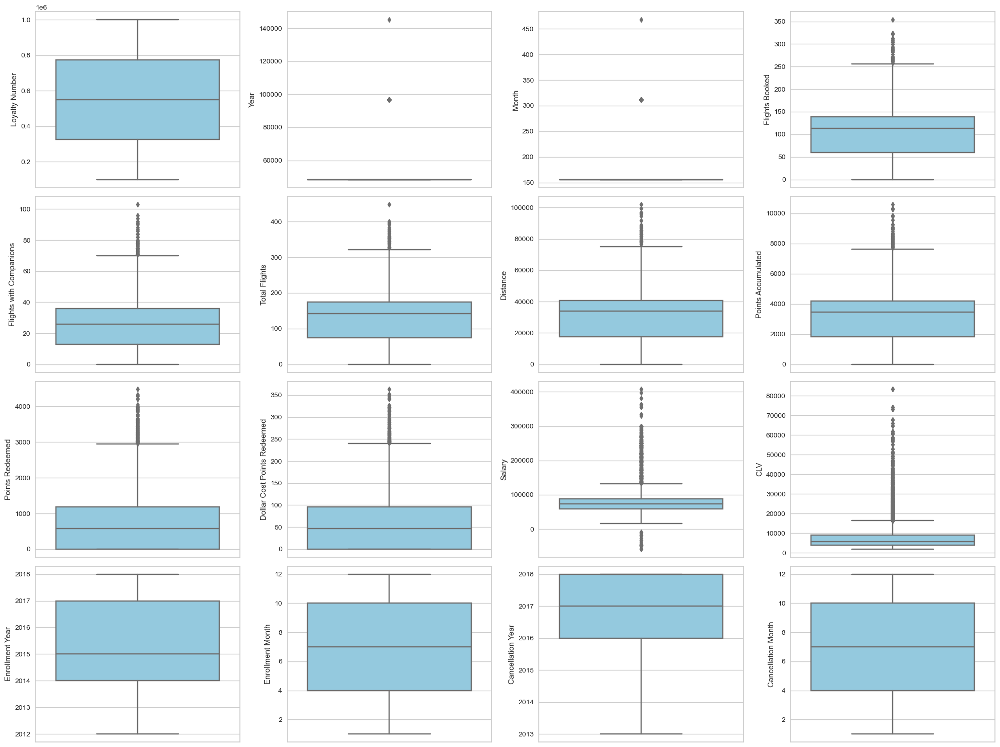

In [9]:
# Checking for Outliers

nums = airline_df.select_dtypes(include=[np.number], exclude=[bool]).columns

plt.figure(figsize=(20,15))
features = nums
for i in range(0, len(features)):
    plt.subplot(4, 4, i+1)
    sns.boxplot(y=airline_df[features[i]], color='skyblue')
    plt.tight_layout()

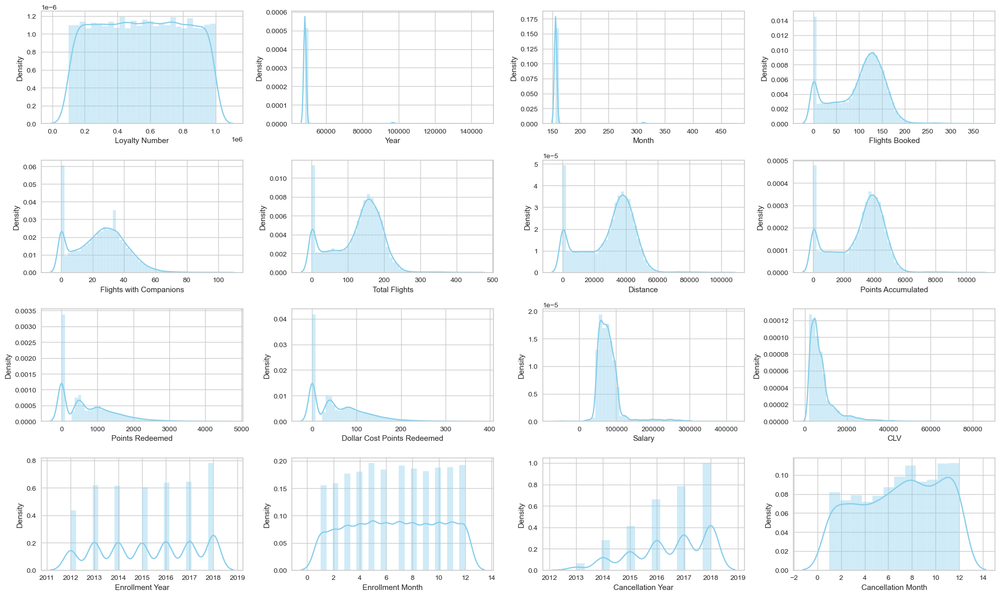

In [10]:
# Graph of Data Distribution

plt.figure(figsize=(20,12))

for i in range(0, len(features)):
    plt.subplot(4, 4, i+1)
    sns.distplot(x=airline_df[features[i]], color='skyblue')
    plt.xlabel(features[i])
    plt.tight_layout()

From the boxplot and KDE plots above, we can observe:

1. `Loyalty Number` has unique values so no need to check its symmetricity
2.  Most of the features are positively skewed & have some extreme features

## Multivariate Analysis

### Check Correlations

In [11]:
airline_encoded=pd.get_dummies(airline_df, columns=['Gender', 'Loyalty Card'])
airline_encoded

,Loyalty Number,Year,Month,Flights Booked,Flights with Companions,Total Flights,Distance,Points Accumulated,Points Redeemed,Dollar Cost Points Redeemed,...,Enrollment Type,Enrollment Year,Enrollment Month,Cancellation Year,Cancellation Month,Gender_Female,Gender_Male,Loyalty Card_Aurora,Loyalty Card_Nova,Loyalty Card_Star
0,100018,48420,156,157,35,192,50682,5376.00,1513,123,...,Standard,2016,8,NaN,NaN,True,False,True,False,False
1,100102,48420,156,173,42,215,40222,4115.25,1195,96,...,Standard,2013,3,NaN,NaN,False,True,False,True,False
2,100140,48420,156,152,38,190,41252,4184.25,593,48,...,Standard,2016,7,NaN,NaN,True,False,False,True,False
3,100214,48420,156,79,17,96,33982,3426.00,861,70,...,Standard,2015,8,NaN,NaN,False,True,False,False,True
4,100272,48420,156,127,36,163,40872,4108.04,1007,82,...,Standard,2014,1,NaN,NaN,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16732,999902,48420,156,178,47,225,57227,6056.50,876,71,...,Standard,2014,5,NaN,NaN,False,True,True,False,False
16733,999911,48420,156,0,0,0,0,0.00,0,0,...,Standard,2012,8,NaN,NaN,False,True,False,True,False
16734,999940,48420,156,63,23,86,23410,2415.00,672,54,...,Standard,2017,7,NaN,NaN,True,False,False,True,False
16735,999982,48420,156,22,2,24,5948,594.00,0,0,...,Standard,2018,7,NaN,NaN,False,True,False,False,True


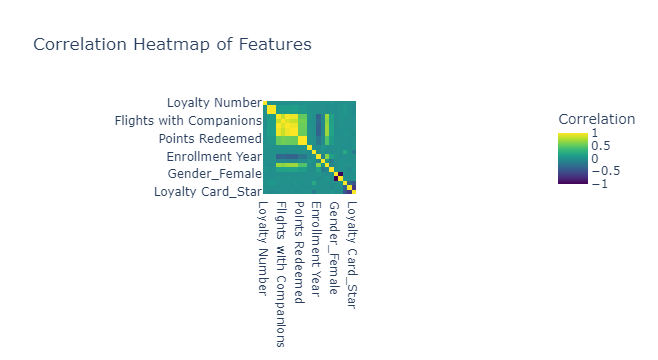

In [12]:
# Create a correlation matrix
num = airline_encoded.select_dtypes(include=['int64', 'float64', 'boolean']).columns

correlation_matrix = airline_encoded[num].corr()

fig0 = px.imshow(correlation_matrix,
                labels=dict(color="Correlation"),
                x=correlation_matrix.index,
                y=correlation_matrix.columns,
                color_continuous_scale='Viridis',
                title='Correlation Heatmap of Features')

# Show the plot
fig0.show()

**According to the correlation heatmap, there are some observations:**

1. Those members who have cancelled their membership have a negative trend with the number of flights and points accumulated/redeemed.
2. A higher value of `Enrollment Year` and a lower value of `Cancellation Year` correlates to a lower value of flights and points accumulated/redeemed.

**Some features appear to be above 2 points due to their shorter record tenure**

1. There is a strong positive trending association between the number of points earned and the number of flights booked.
2. The CLV (Customer Lifetime Value) and the status of the loyalty card have a small association. Star is slightly trending downward, and Aurora is somewhat trending upward.

TLDR;

Since we're more interested in customer behavior rather than temporal trends, columns `Month` and `Year` may not provide significant value for segmentation. Let's remove these 2 columns as well.

### Remove Irrelevant Columns 

In [13]:
# Remove columns 'Country', 'Province' & 'Dollar Cost Points Redeemed'
final_df = airline_df.drop([
         'Country',
         'Province',
         'Postal Code',
         'Dollar Cost Points Redeemed', 
         'Year',
         'Month',
         'Enrollment Month',
         'Cancellation Month'
        ], axis=1)

# Display results
final_df

,Loyalty Number,Flights Booked,Flights with Companions,Total Flights,Distance,Points Accumulated,Points Redeemed,City,Gender,Education,Salary,Marital Status,Loyalty Card,CLV,Enrollment Type,Enrollment Year,Cancellation Year
0,100018,157,35,192,50682,5376.00,1513,Edmonton,Female,Bachelor,92552.0,Married,Aurora,7919.20,Standard,2016,NaN
1,100102,173,42,215,40222,4115.25,1195,Toronto,Male,College,NaN,Single,Nova,2887.74,Standard,2013,NaN
2,100140,152,38,190,41252,4184.25,593,Dawson Creek,Female,College,NaN,Divorced,Nova,2838.07,Standard,2016,NaN
3,100214,79,17,96,33982,3426.00,861,Vancouver,Male,Bachelor,63253.0,Married,Star,4170.57,Standard,2015,NaN
4,100272,127,36,163,40872,4108.04,1007,Toronto,Female,Bachelor,91163.0,Divorced,Star,6622.05,Standard,2014,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16732,999902,178,47,225,57227,6056.50,876,Toronto,Male,College,NaN,Married,Aurora,7290.07,Standard,2014,NaN
16733,999911,0,0,0,0,0.00,0,St. John's,Male,Doctor,217943.0,Single,Nova,8564.77,Standard,2012,NaN
16734,999940,63,23,86,23410,2415.00,672,Quebec City,Female,Bachelor,47670.0,Married,Nova,20266.50,Standard,2017,NaN
16735,999982,22,2,24,5948,594.00,0,Victoria,Male,College,NaN,Married,Star,2631.56,Standard,2018,NaN


## 1. Data Preprocessing<a name="Section1"></a>

We need to clean our data first before proceeding with our ML tasks for this project.

Let's proceed with checking the crucial info in our data to facilitate the data preprocessing phase.

### 1.1 Missing Values Check

<Axes: >

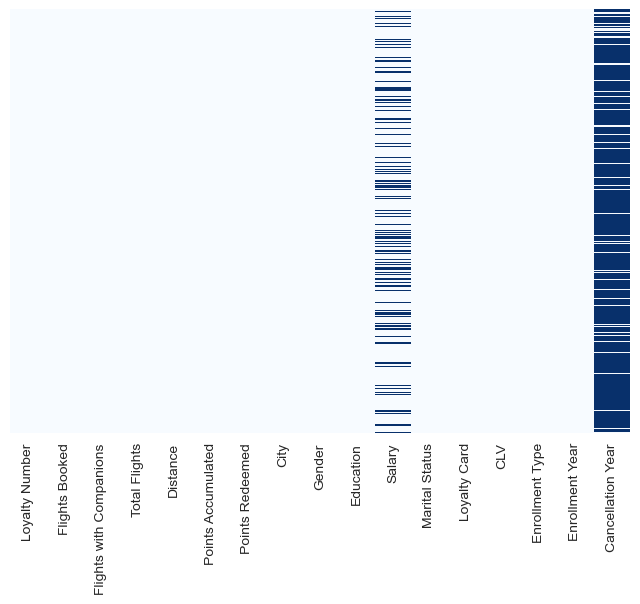

In [14]:
# Let's see if we have any missing data.
sns.heatmap(final_df.isnull(), yticklabels = False, cbar = False, cmap="Blues")

It is obvious that there are missing values in `Salary` & `Cancellation Year` based on their % of null values

- `Salary` and `Cancellation Year` will remain as it is since we don't really need them in our analysis

### 1.2 Duplications Check

In [15]:
new_final_deduped = final_df.drop_duplicates()

print("Number of records after removing duplicates : {}".format(new_final_deduped.shape[0]))
print("Number of records in original dataset : {}".format(final_df.shape[0]))

new_final_deduped

Number of records after removing duplicates : 16737
Number of records in original dataset : 16737


,Loyalty Number,Flights Booked,Flights with Companions,Total Flights,Distance,Points Accumulated,Points Redeemed,City,Gender,Education,Salary,Marital Status,Loyalty Card,CLV,Enrollment Type,Enrollment Year,Cancellation Year
0,100018,157,35,192,50682,5376.00,1513,Edmonton,Female,Bachelor,92552.0,Married,Aurora,7919.20,Standard,2016,NaN
1,100102,173,42,215,40222,4115.25,1195,Toronto,Male,College,NaN,Single,Nova,2887.74,Standard,2013,NaN
2,100140,152,38,190,41252,4184.25,593,Dawson Creek,Female,College,NaN,Divorced,Nova,2838.07,Standard,2016,NaN
3,100214,79,17,96,33982,3426.00,861,Vancouver,Male,Bachelor,63253.0,Married,Star,4170.57,Standard,2015,NaN
4,100272,127,36,163,40872,4108.04,1007,Toronto,Female,Bachelor,91163.0,Divorced,Star,6622.05,Standard,2014,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16732,999902,178,47,225,57227,6056.50,876,Toronto,Male,College,NaN,Married,Aurora,7290.07,Standard,2014,NaN
16733,999911,0,0,0,0,0.00,0,St. John's,Male,Doctor,217943.0,Single,Nova,8564.77,Standard,2012,NaN
16734,999940,63,23,86,23410,2415.00,672,Quebec City,Female,Bachelor,47670.0,Married,Nova,20266.50,Standard,2017,NaN
16735,999982,22,2,24,5948,594.00,0,Victoria,Male,College,NaN,Married,Star,2631.56,Standard,2018,NaN


There are no duplicate records found in the dataframe. Thus, we're going to use **final_df** moving forward.

### 1.3 Feature Engineering

If a member has cancelled their membership, we will set a column only for **yes (1)** or **no (0)** values

In [16]:
final_df['Cancelled'] = final_df['Cancellation Year'].notna().astype(int) 
final_df

,Loyalty Number,Flights Booked,Flights with Companions,Total Flights,Distance,Points Accumulated,Points Redeemed,City,Gender,Education,Salary,Marital Status,Loyalty Card,CLV,Enrollment Type,Enrollment Year,Cancellation Year,Cancelled
0,100018,157,35,192,50682,5376.00,1513,Edmonton,Female,Bachelor,92552.0,Married,Aurora,7919.20,Standard,2016,NaN,0
1,100102,173,42,215,40222,4115.25,1195,Toronto,Male,College,NaN,Single,Nova,2887.74,Standard,2013,NaN,0
2,100140,152,38,190,41252,4184.25,593,Dawson Creek,Female,College,NaN,Divorced,Nova,2838.07,Standard,2016,NaN,0
3,100214,79,17,96,33982,3426.00,861,Vancouver,Male,Bachelor,63253.0,Married,Star,4170.57,Standard,2015,NaN,0
4,100272,127,36,163,40872,4108.04,1007,Toronto,Female,Bachelor,91163.0,Divorced,Star,6622.05,Standard,2014,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16732,999902,178,47,225,57227,6056.50,876,Toronto,Male,College,NaN,Married,Aurora,7290.07,Standard,2014,NaN,0
16733,999911,0,0,0,0,0.00,0,St. John's,Male,Doctor,217943.0,Single,Nova,8564.77,Standard,2012,NaN,0
16734,999940,63,23,86,23410,2415.00,672,Quebec City,Female,Bachelor,47670.0,Married,Nova,20266.50,Standard,2017,NaN,0
16735,999982,22,2,24,5948,594.00,0,Victoria,Male,College,NaN,Married,Star,2631.56,Standard,2018,NaN,0


In [17]:
# Save the merged + cleaned dataset as a CSV file
final_df.to_csv('Merged Customer Loyalty Flights.csv', index=False)

## 2. Data Visualization & Analysis<a name="Section2"></a>

## Table of Contents<a name="TOC"></a>

2.1 [Demographic Analysis](#Section7)

2.2 [Customer Flight Patterns](#Section8)

2.3 [Loyalty Program Insights](#Section9)

2.4 [Customer Lifetime Value (CLV) Analysis](#Section10)

2.5 [Churn Analysis and Retention Strategies](#Section11)

### 2.1 Demographic Analysis <a name="Section7"></a>

**What are the primary cities from which customers are enrolled in the loyalty program?**

In [18]:
# Create a count of customers by city
city_counts = new_final_deduped['City'].value_counts().reset_index(name='Count')

# Sort the city counts in descending order
city_counts = city_counts.sort_values(by='Count', ascending=True)  # Descending order

# Create the horizontal bar chart with Plotly Express
fig = px.bar(
    city_counts,  # Data is the city counts Series
    x= 'Count',  # x-axis represents the city names
    y= 'City',  # y-axis represents the city counts (index of the Series)
    orientation='h',  # Set orientation to 'h' for horizontal bars
    title='Distribution of Customers Across Cities',  # Title for the chart
    template='plotly_dark'
)

# Update x-axis title (optional)
fig.update_xaxes(title_text='Number of Customers')

# Show the chart
fig.show()

**What is the distribution of customers based on education and salary over enrollment years?**

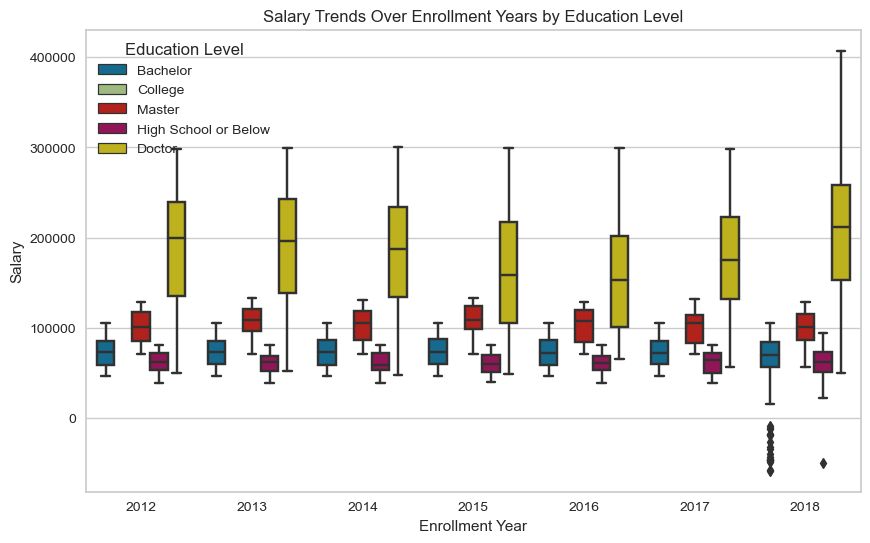

In [19]:
# Education levels and salary trends over enrollment years
plt.figure(figsize=(10, 6))
sns.boxplot(data=new_final_deduped, x='Enrollment Year', y='Salary', hue='Education')
plt.title('Salary Trends Over Enrollment Years by Education Level')
plt.xlabel('Enrollment Year')
plt.ylabel('Salary')
plt.legend(title='Education Level')
plt.show()

### 2.2 Customer Flight Patterns <a name="Section8"></a>

**What are the most common routes taken by customers?**

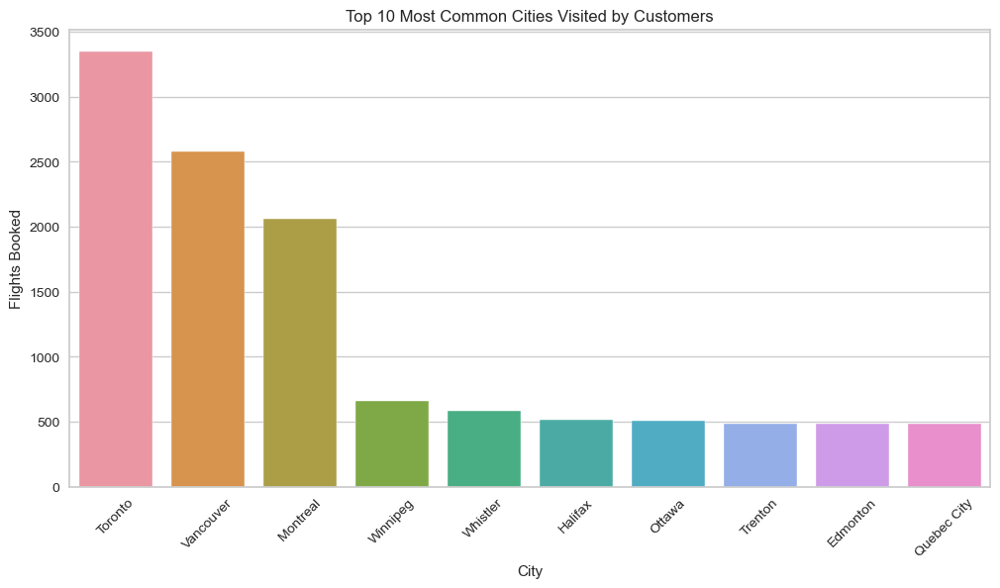

In [20]:
# Top 10 most common routes
top_routes = final_df['City'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_routes.index, y=top_routes.values)
plt.title('Top 10 Most Common Cities Visited by Customers')
plt.xlabel('City')
plt.ylabel('Flights Booked')
plt.xticks(rotation=45)
plt.show()

In [21]:
flights = final_df[new_final_deduped['City'].isin(['Toronto', 'Vancouver', 'Montreal'])]
sum_TVM = flights['Flights Booked'].sum()
sum_total = final_df['Flights Booked'].sum()
percent=(sum_TVM/sum_total)*100

print(f"Out of all the flights booked in Canada, {percent:.2f}% of them are from Toronto, Vancouver or Montreal")

Out of all the flights booked in Canada, 47.77% of them are from Toronto, Vancouver or Montreal


**It's not surprising that the top three Canadian cities have the most flights booked. Toronto, Vancouver, and Montreal booked 47.7% of all flights.**

Now let's explore to see if we can identify high-value customers who regularly book flights or redeem their points

**Can we identify high-value customers who frequently book flights or redeem points?**

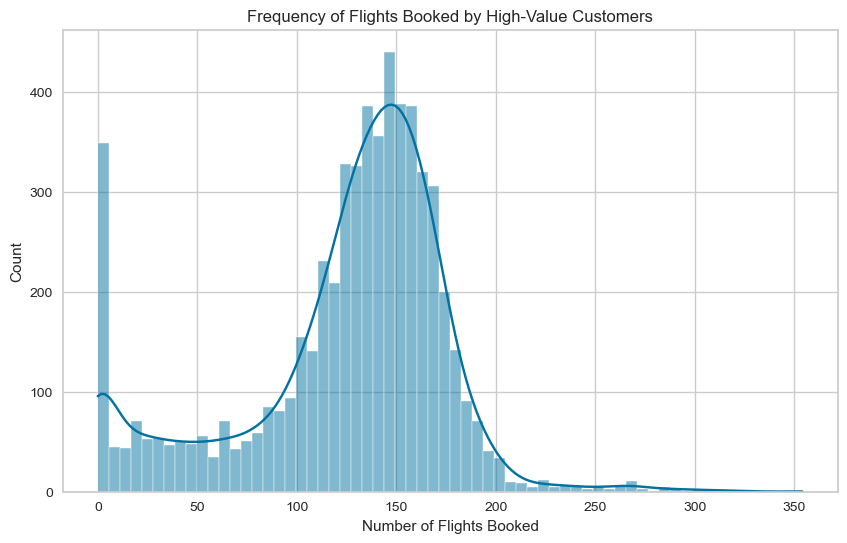

In [22]:
# Define high-value customers based on CLV or total points accumulated
high_value_customers = final_df[(final_df['CLV'] > final_df['CLV'].quantile(0.8)) | (final_df['Points Accumulated'] > final_df['Points Accumulated'].quantile(0.8))]

# Plotting frequency of flights booked by high-value customers
plt.figure(figsize=(10, 6))
sns.histplot(high_value_customers['Flights Booked'], kde=True)
plt.title('Frequency of Flights Booked by High-Value Customers')
plt.xlabel('Number of Flights Booked')
plt.ylabel('Count')
plt.grid(True)
plt.show()

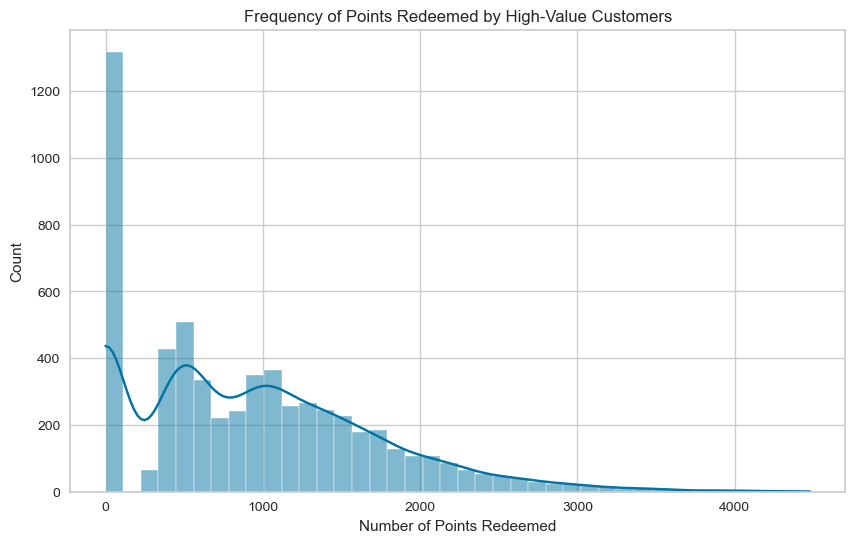

In [23]:
# Plotting frequency of points redeemed by high-value customers
plt.figure(figsize=(10, 6))
sns.histplot(high_value_customers['Points Redeemed'], kde=True)
plt.title('Frequency of Points Redeemed by High-Value Customers')
plt.xlabel('Number of Points Redeemed')
plt.ylabel('Count')
plt.grid(True)
plt.show()

Based on the plotted histogram charts for `Flights Booked` and  `Points Redeemed`, it is noteworthing mentioning that these 2 features can identify high-value customers

We need to consider these 2 features when developing the clustering model for customer segmentation.

### 2.3 Loyalty Program Insights <a name="Section9"></a>

**Points Accumulation and Redemption**
<br>How do customers accumulate and redeem loyalty points? Are there any distinct patterns or trends within different segments?

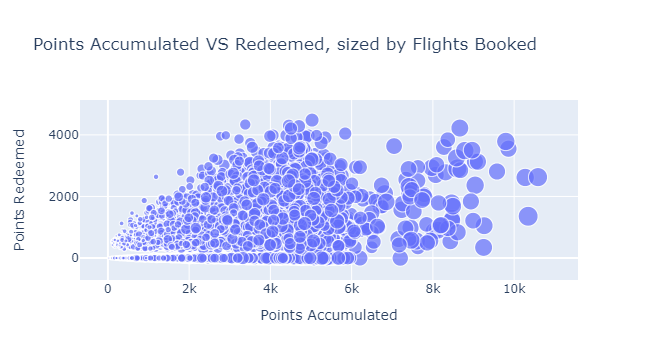

In [25]:
fig02 = px.scatter(final_df, x='Points Accumulated', y='Points Redeemed',
                         size='Flights Booked', hover_data=['Loyalty Number'],
                         title='Points Accumulated VS Redeemed, sized by Flights Booked')
fig02.show()

**We can infer from the above graph that the more points are accumulated, the more flights are booked. Additionally, despite what logic dictates, it is not clear that more accumulation results to higher redemption of points.**

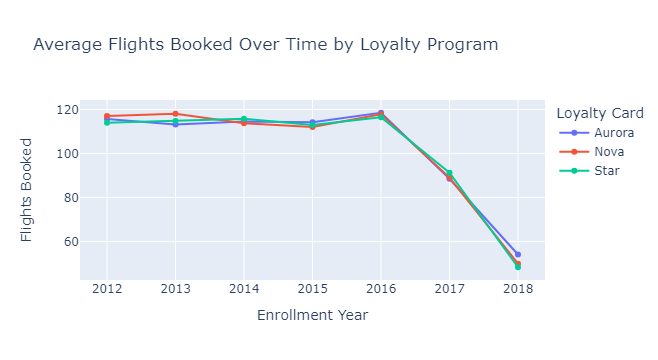

In [26]:
# Trends in frequency of flights booked by loyalty program members over time
loyalty_flights_over_time = final_df.groupby(['Enrollment Year', 'Loyalty Card'])['Flights Booked'].mean().reset_index()
fig03 = px.line(loyalty_flights_over_time, x='Enrollment Year', y='Flights Booked', markers=True, color='Loyalty Card', title='Average Flights Booked Over Time by Loyalty Program')
fig03.show()

### 2.4 Customer Lifetime Value (CLV) Analysis<a name="Section10"></a>

**What is the distribution of customer lifetime value (CLV) among loyalty program members?**

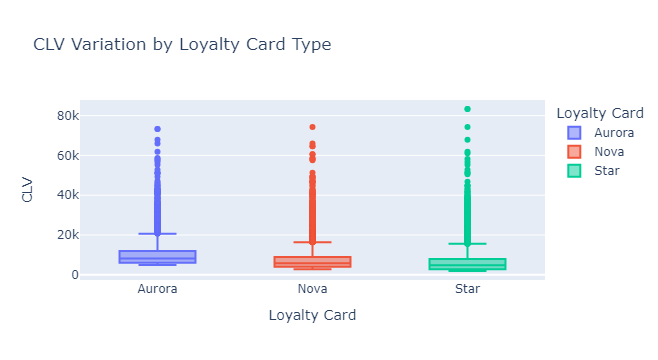

In [27]:
fig = px.box(final_df, x='Loyalty Card', y='CLV', color= 'Loyalty Card', title='CLV Variation by Loyalty Card Type')
fig.show()

**How does the CLV vary for customers enrolled in different loyalty card types?**

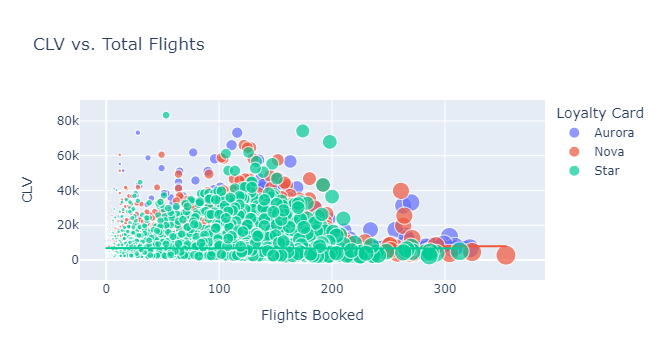

In [28]:
fig = px.scatter(final_df, x='Flights Booked', y='CLV', 
                color='Loyalty Card', size = 'Flights Booked', trendline='ols', 
                title='CLV vs. Total Flights')

fig.show()

**We can infer from the above graph that in general, customers with higher CLV tend to have booked more flights, Additionally, despite what logic dictates, it is not clear that more accumulation results to higher redemption of points.**

The scatter plot shows a weak positive correlation between Customer Lifetime Value (CLV) and Total Flights booked. This suggests that, in general, customers with higher CLV tend to have booked more flights, but there are also many exceptions. Notably, there are customers with high CLV who haven't booked any flights.


**Conclusion**

This implies that while flight frequency is a factor influencing CLV, it might not be the sole driver. Other factors, like the value of the flights booked (e.g., expensive business class tickets) or the use of loyalty program benefits (e.g., lounge access), could also contribute to CLV.

### 2.5 Churn Analysis and Retention Strategies<a name="Section11"></a>

**Is there any observable churn or attrition among customers enrolled in the loyalty program?**

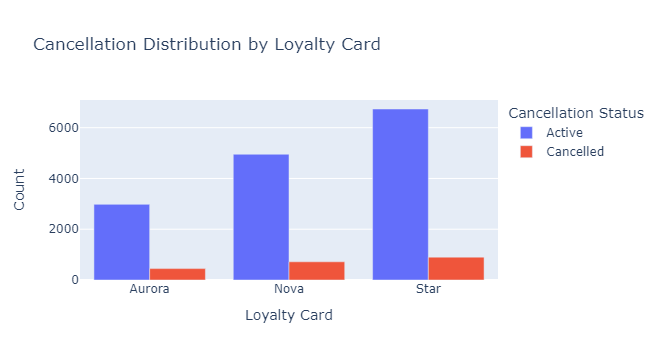

In [29]:
# Map Cancelled values to 'Active' and 'Cancelled'
final_df['Cancellation Status'] = final_df['Cancelled'].map({0: 'Active', 1: 'Cancelled'})

# Plot cancellation distribution based on Loyalty Card column
cancelled_counts = final_df.groupby(['Loyalty Card', 'Cancellation Status']).size().reset_index(name='Count')


fig = px.bar(cancelled_counts, 
             x='Loyalty Card', 
             y='Count', 
             color='Cancellation Status',
             barmode='group', 
             title='Cancellation Distribution by Loyalty Card')

fig.update_layout(xaxis_title='Loyalty Card', 
                  yaxis_title='Count', 
                  legend_title='Cancellation Status')


fig.show()

In [65]:
# Cancellation Rate Analysis
cancellation_rate = final_df['Cancelled'].mean() * 100
print("Cancellation Rate among Program Members: {:.2f}%".format(cancellation_rate))

Cancellation Rate among Program Members: 12.35%


Despite Star loyalty card has the highest churn, it has the most active members as opposed to the other loyalty card program (Aurora and Nova).

Nevertheless, the number of active members in every loyalty card exceeds the inactive (cancelled) members with a cancellation rate of 12.35% among program members. Thus, we're going to focus on the active members for our analysis.

**What is the net change in enrollment (new enrollments minus cancellations) per year, and are there any trends over time?**

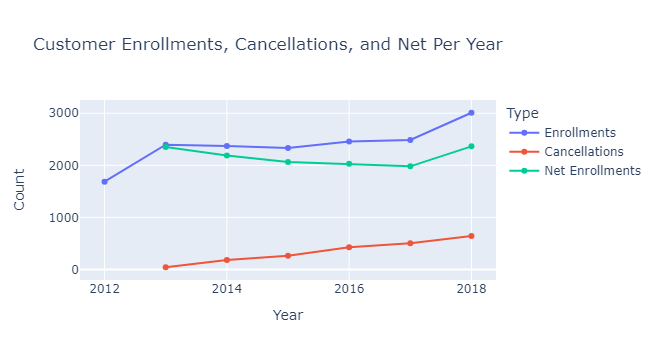

In [30]:
# Grouping data by Enrollment Year to count enrollments per year
enrollments_per_year = final_df.groupby('Enrollment Year')['Loyalty Number'].count().reset_index()
enrollments_per_year.rename(columns={'Loyalty Number': 'Enrollments'}, inplace=True)

# Grouping data by Cancellation Year to count cancellations per year
cancellations_per_year = final_df.groupby('Cancellation Year')['Cancelled'].sum().reset_index()
cancellations_per_year.rename(columns={'Cancelled': 'Cancellations'}, inplace=True)

# Merging enrollments and cancellations data
enrollments_cancellations = enrollments_per_year.merge(cancellations_per_year, how='outer', left_on='Enrollment Year', right_on='Cancellation Year')

# Calculating net enrollments per year
enrollments_cancellations['Net Enrollments'] = enrollments_cancellations['Enrollments'] - enrollments_cancellations['Cancellations']

# Plotting using Plotly Express
fig = px.line(enrollments_cancellations, x='Enrollment Year', y=['Enrollments', 'Cancellations', 'Net Enrollments'],
              markers=True, title='Customer Enrollments, Cancellations, and Net Per Year',
              labels={'value': 'Count', 'variable': 'Type', 'Enrollment Year': 'Year'})
fig.show()

The customers churn positively. Despite a rising cancellation rate of customers across the years, the enrollments are in such a high number, that the net is slightly affected.

There is a profitable uptrend from 2017-18 owing to the high number of enrollments.¶


## 3. Feature Selection<a name="Section3"></a>

## RFM Analysis

RFM analysis is a powerful method for segmenting customers based on their transaction history, focusing on three key metrics:

**Recency (R)** -  How recently did the customer make a purchase or engage with the business?

**Frequency (F)** - How often does the customer make purchases or engage with the business?

**Monetary (M)** - How much money does the customer spend or generate for the business?


Given our latest dataset, these features can be used for RFM Analysis:

1. **R**ecency - Combining columns `Enrollment Year` & `Cancellation Year` would calculate the time since the last engagement or purchase made by the customer
2. **F**requency - `Flights Booked`
3. **M**onetary - `Points Accumulated` & `Points Redeemed`

Since we're focusing more on Active Customers Behaviour, cancelled memberships and those customers with 0 flights are irrelevant in this context. Let's remove it:

In [31]:
customer = final_df[(final_df['Cancelled'] != 1) & (final_df['Flights Booked'] > 0)]

In [32]:
customer = customer[['Loyalty Number', 'Enrollment Year', 'Flights Booked', 'CLV']]
customer

,Loyalty Number,Enrollment Year,Flights Booked,CLV
0,100018,2016,157,7919.20
1,100102,2013,173,2887.74
2,100140,2016,152,2838.07
3,100214,2015,79,4170.57
4,100272,2014,127,6622.05
...,...,...,...,...
16729,999758,2018,16,18690.34
16732,999902,2014,178,7290.07
16734,999940,2017,63,20266.50
16735,999982,2018,22,2631.56


#### Calculate Recency, Frequency, and Monetary values

**A) Recency**

Recency, a core metric in RFM, provides a basic indication of how long it's been since a customer first joined the program. In this case, we'll use the `Enrollment Year`


To calculate Recency, we'll start by creating a new dataframe to hold all RFM scores per customer by grouping per `Loyalty Number`

In [33]:
# Get today's date automatically from the system
today = date.today()

# Calculate Recency (Years) directly within 'customers' DataFrame
customer['Recency'] = today.year - customer['Enrollment Year']

# Group Recency by Loyalty Number (Optional)
# This step is optional but provides Recency details for each customer
recency_group = customer.groupby('Loyalty Number')['Recency'].sum().reset_index()
recency_group.columns = ['Loyalty Number', 'Total Recency (Years)']  # Rename Recency column

# Optionally, merge 'recency_group' with 'customers' for detailed Recency information
# This step is optional but provides both total and individual year Recency
customer = pd.merge(customer, recency_group, on='Loyalty Number', how='left')


# Drop the 'Total Recency (Years)' column if it exists
if 'Total Recency (Years)' in customer.columns:
    customer.drop(columns=['Total Recency (Years)'], inplace=True)

In [34]:
# Display the first few rows of the modified customer DataFrame
customer.head()

,Loyalty Number,Enrollment Year,Flights Booked,CLV,Recency
0,100018,2016,157,7919.20,8
1,100102,2013,173,2887.74,11
2,100140,2016,152,2838.07,8
3,100214,2015,79,4170.57,9
4,100272,2014,127,6622.05,10


**B) Frequency**

Frequency could represent the total number of flights booked within a certain period.  It helps to differentiate between frequent and infrequent flyers.

Thus, it makes perfect sense to use `Flights Booked` grouped by `Loyalty Number` for this purpose

In [35]:
# Calculate Frequency: Number of flights booked
frequency = customer.groupby('Loyalty Number')['Flights Booked'].sum().reset_index()
frequency.columns = ['Loyalty Number', 'Frequency']

# Consolidate Frequency to existing Customer DataFrame
customer = pd.merge(customer, frequency, on='Loyalty Number')

customer.head()

,Loyalty Number,Enrollment Year,Flights Booked,CLV,Recency,Frequency
0,100018,2016,157,7919.20,8,157
1,100102,2013,173,2887.74,11,173
2,100140,2016,152,2838.07,8,152
3,100214,2015,79,4170.57,9,79
4,100272,2014,127,6622.05,10,127


**C) Monetary Value (Revenue)**

<j>While the dataset does not contain any Revenue columns, we could use column `CLV` which reflects a customer's worth. The reason behind choosing it is that `CLV` captures the total monetary value a customer has generated for the airline through flight bookings. 

This provides a more straightforward measure of a customer's financial contribution to the airline compared to features derived solely from points activity.

The grouping goes by `Loyalty Number` and the aggregation funciton in Sum

In [36]:
# Calculate Monetary: Customer Lifetime Value (CLV)
monetary = customer.groupby('Loyalty Number')['CLV'].sum().reset_index()
monetary.columns = ['Loyalty Number', 'Monetary']

# Consolidate Monetary to existing Customer DataFrame
customer = pd.merge(customer, monetary, on='Loyalty Number')

In [37]:
# Display full customer Dataframe
display(customer)

,Loyalty Number,Enrollment Year,Flights Booked,CLV,Recency,Frequency,Monetary
0,100018,2016,157,7919.20,8,157,7919.20
1,100102,2013,173,2887.74,11,173,2887.74
2,100140,2016,152,2838.07,8,152,2838.07
3,100214,2015,79,4170.57,9,79,4170.57
4,100272,2014,127,6622.05,10,127,6622.05
...,...,...,...,...,...,...,...
14102,999758,2018,16,18690.34,6,16,18690.34
14103,999902,2014,178,7290.07,10,178,7290.07
14104,999940,2017,63,20266.50,7,63,20266.50
14105,999982,2018,22,2631.56,6,22,2631.56


In [38]:
# Create summry data Info
# Find out unique value, number of missing values & datatype of each column (Numerical and Non-Numerical)

list = []

for col in customer.columns:
    # Get the top value and its count (using value_counts().idxmax())
    top_value = customer[col].value_counts().idxmax()  # Corrected method
    top_count = customer[col].value_counts().max()
    list.append([
        col, 
        customer[col].dtype, 
        customer[col].isna().sum(), 
        100*customer[col].isna().sum()/len(customer[col]),
        customer[col].unique()[0:3], 
        customer[col].nunique(),
        top_value,  # Include top values with frequencies
        top_count])
        
    
final_summary = pd.DataFrame(
            data=list, 
            columns=[
            'Feature', 
            'Dtype', 
            'NaN',
            '%NaN',
            'Unique', 
            'Total Unique', 
            'Top', 
            'Frequency']
)

final_summary

,Feature,Dtype,NaN,%NaN,Unique,Total Unique,Top,Frequency
0,Loyalty Number,int64,0,0.0,"[100018, 100102, 100140]",14107,100018.0,1
1,Enrollment Year,int64,0,0.0,"[2016, 2013, 2015]",7,2018.0,2528
2,Flights Booked,int64,0,0.0,"[157, 173, 152]",267,113.0,175
3,CLV,float64,0,0.0,"[7919.2, 2887.74, 2838.07]",7646,13727.8,12
4,Recency,int64,0,0.0,"[8, 11, 9]",7,6.0,2528
5,Frequency,int64,0,0.0,"[157, 173, 152]",267,113.0,175
6,Monetary,float64,0,0.0,"[7919.2, 2887.74, 2838.07]",7646,13727.8,12


In [39]:
customer.describe()

,Loyalty Number,Enrollment Year,Flights Booked,CLV,Recency,Frequency,Monetary
count,14107.000000,14107.000000,14107.000000,14107.000000,14107.000000,14107.000000,14107.000000
mean,549386.250018,2015.242149,113.975898,7961.448493,8.757851,113.975898,7961.448493
std,258590.691345,1.988212,44.413579,6781.931409,1.988212,44.413579,6781.931409
min,100018.000000,2012.000000,1.000000,1898.010000,6.000000,1.000000,1898.010000
25%,326705.000000,2014.000000,92.000000,3966.130000,7.000000,92.000000,3966.130000
50%,549751.000000,2015.000000,121.000000,5780.180000,9.000000,121.000000,5780.180000
75%,772299.500000,2017.000000,144.000000,8943.135000,10.000000,144.000000,8943.135000
max,999986.000000,2018.000000,354.000000,74228.520000,12.000000,354.000000,74228.520000


#### Step 2: Selecting RFM Features

In [40]:
# Select RFM features
rfm_df = customer[['Recency', 'Frequency', 'Monetary']]

display(rfm_df)

,Recency,Frequency,Monetary
0,8,157,7919.20
1,11,173,2887.74
2,8,152,2838.07
3,9,79,4170.57
4,10,127,6622.05
...,...,...,...
14102,6,16,18690.34
14103,10,178,7290.07
14104,7,63,20266.50
14105,6,22,2631.56


Each column has a different range. Thus, we have to conduct data standardization.

### Data Standardization

In [41]:
# Standardize the data
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_df.astype(float))

In [42]:
rfm_scaled = pd.DataFrame(data=rfm_scaled, columns=rfm_df.columns)
rfm_scaled.head()

,Recency,Frequency,Monetary
0,-0.381186,0.968749,-0.006230
1,1.127762,1.329012,-0.748148
2,-0.381186,0.856167,-0.755472
3,0.121797,-0.787533,-0.558987
4,0.624779,0.293256,-0.197502


In [43]:
rfm_scaled.describe()

,Recency,Frequency,Monetary
count,1.410700e+04,1.410700e+04,1.410700e+04
mean,-1.793104e-16,2.845797e-17,-7.303374e-17
std,1.000035e+00,1.000035e+00,1.000035e+00
min,-1.387150e+00,-2.543814e+00,-8.940895e-01
25%,-8.841679e-01,-4.948189e-01,-5.891331e-01
50%,1.217968e-01,1.581577e-01,-3.216408e-01
75%,6.247792e-01,6.760357e-01,1.447554e-01
max,1.630744e+00,5.404487e+00,9.771467e+00


Let's plot the histograms for each of R, F & M values

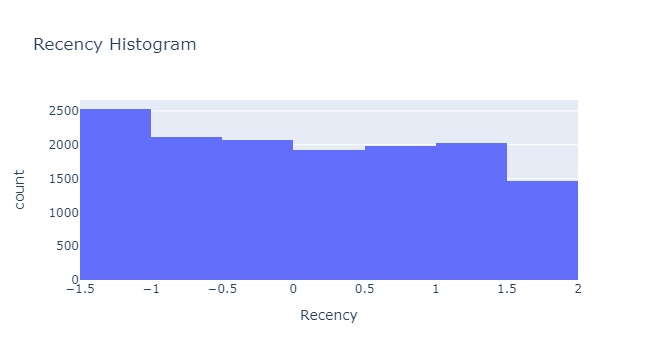

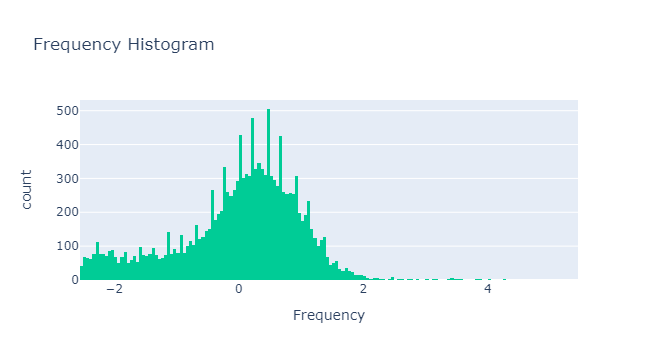

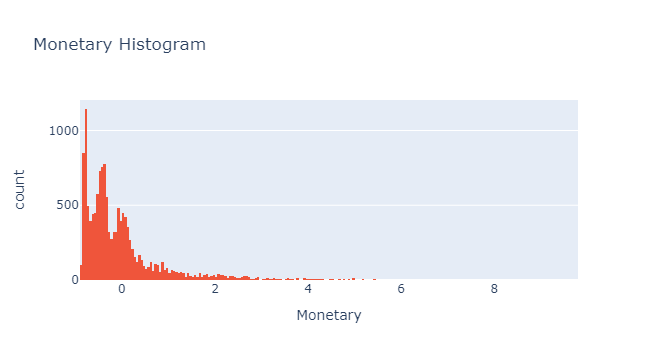

In [44]:
# Create histograms for Recency, Frequency, and Monetary using Plotly Express
fig07 = px.histogram(rfm_scaled, x='Recency', title='Recency Histogram', color_discrete_sequence=['#636EFA'])
fig08 = px.histogram(rfm_scaled, x='Frequency', title='Frequency Histogram', color_discrete_sequence=['#00CC96'])
fig09 = px.histogram(rfm_scaled, x='Monetary', title='Monetary Histogram', color_discrete_sequence=['#EF553B'])

# Show the histograms
fig07.show()
fig08.show()
fig09.show()

## 4. Model Generation & Evaluation<a name="Section4"></a>

### K-Means Clustering

K-Means clustering algorithm is an unsupervised machine learning algorithm that uses multiple iterations to segment the unlabeled data points into K different clusters in a way such that each data point belongs to only a single group that has similar properties.

<img src="https://static.javatpoint.com/tutorial/machine-learning/images/k-means-clustering-algorithm-in-machine-learning.png">

**Why use K-Means Algorithm for Customer Segmentation?**

K-Means algorithm is chosen for customer segmentation in this project due to its simplicity, efficiency, and effectiveness in identifying distinct clusters within the dataset.

It offers a practical and efficient approach to customer segmentation, providing valuable insights into customer behavior and preferences for enhanced marketing and loyalty program management.

Before we proceed with the modeling, we have to determine the number of clusters. For determining the optimal number of clusters, I check the inertia using the **Elbow Plot**

### A) Elbow Plot

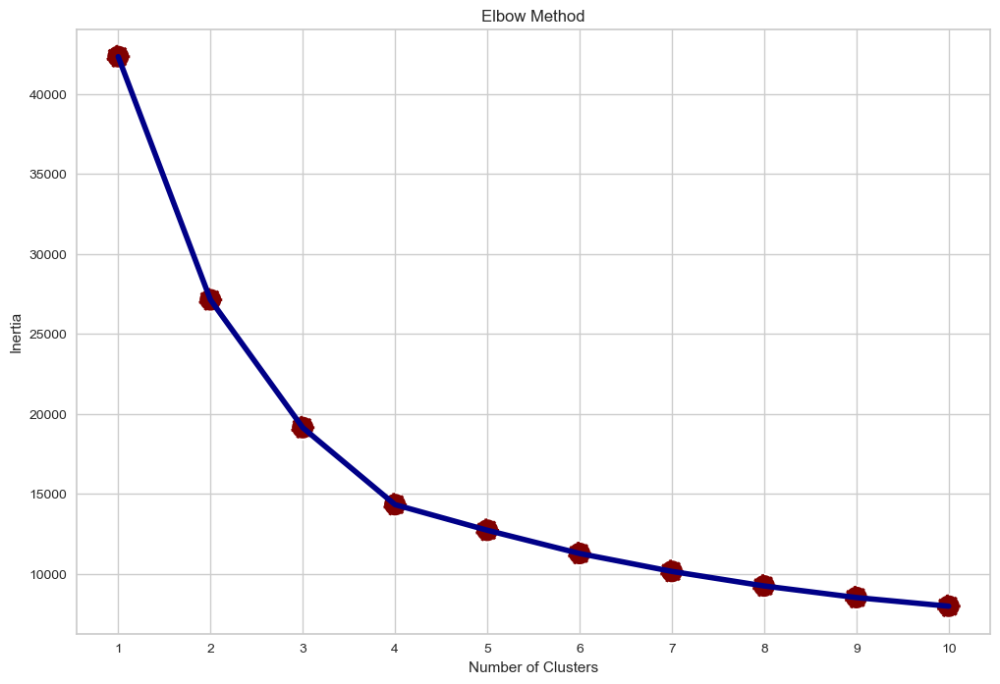

In [46]:
# Calculates inertia values for 2 to 10 clusters
inertia = []

for k in range(1, 11):
    # Fit KMeans clustering model 
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_scaled)
    inertia.append(kmeans.inertia_)

# Plotting the Elbow Method
plt.figure(figsize=(12, 8))
sns.lineplot(x=range(1, 11), y=inertia, color='#000087', linewidth = 4)
sns.scatterplot(x=range(1, 11), y=inertia, s=300, color='#800000',  linestyle='--')
plt.xticks(range(1,11))
plt.title('Elbow Method')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.show()

From elbow plot, there is a possibility that the optimum clusters are 3-5. Because we need to consider the business value when doing the clustering, I will check the condition when the data is divided into 3, 4 and 5 clusters respectively

In [47]:
# See the difference in inertia percentage for each additional cluster

((pd.Series(inertia) - pd.Series(inertia).shift(-1)) / pd.Series(inertia) * 100).dropna()

0    35.900063
1    29.436003
2    25.130481
3    11.170621
4    11.401933
5     9.927043
6     8.950173
7     7.831286
8     6.341672
dtype: float64

The decrease between k=3 and k=4 (11.40%) is still noticeable, indicating further improvement with 4 clusters.

The decreases after k=4 become smaller (around11560%), suggesting diminishing returns from adding more clusters.

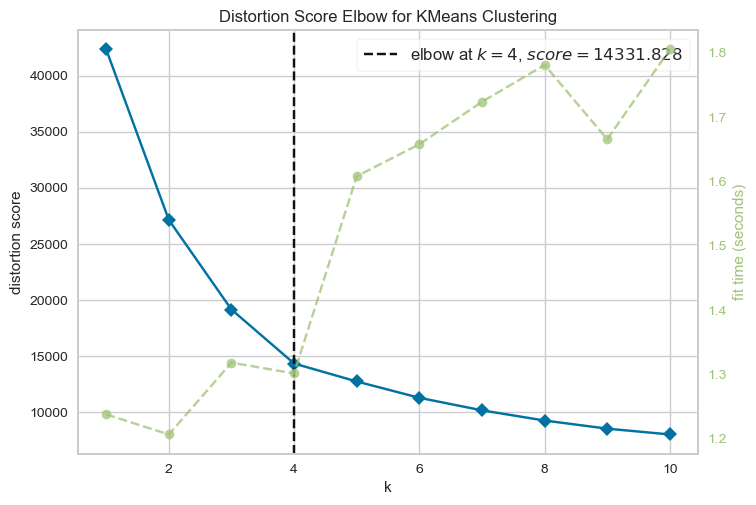

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [48]:
data = rfm_scaled

# Define the KElbowVisualizer
visualizer = KElbowVisualizer(KMeans(), k=(1, 11))  # Adjust k range as needed

# Fit the data to the visualizer
visualizer.fit(data)

# Show the elbow plot
visualizer.show()

Combining these findings:

- The significant initial decrease in inertia followed by a gradual flattening around `k = 4` suggests that adding more clusters beyond this point might not provide substantial benefits.
- Both the Elbow Plot method and KElbowVisualizer support `k = 4` as a good choice within the suggested range.

Therefore, based on both quantitative (percentage decrease) and visual (Elbow Plot & KElbowVisualizer) evidence, `k = 4` is the most reasonable choice for the optimal number of clusters in our RFM analysis.

### Training the Model with Optimal Number of Clusters

Using the optimal value obtained, let's train the model and review its results

In [49]:
# Run and train main K-means algorithm based on all input features
model = KMeans(n_clusters=4, random_state=42)
model.fit(rfm_scaled)

# Review output cluster labels
cluster_labels = model.labels_
print("Assigned cluster labels: \n", cluster_labels)

# Review Centroids of clusters
centroids = model.cluster_centers_
print("Location of centroids: ")
print(centroids)

Assigned cluster labels: 
 [3 0 3 ... 2 1 3]
Location of centroids: 
[[ 1.0849609   0.42384721 -0.23196288]
 [-1.21103651 -1.50469194 -0.16910041]
 [ 0.06956404  0.16105888  2.7846996 ]
 [-0.40669773  0.39274418 -0.24090184]]


In [50]:
# Append clusters to input features table
rfm_scaled['Cluster'] = cluster_labels

rfm_scaled.head()

,Recency,Frequency,Monetary,Cluster
0,-0.381186,0.968749,-0.006230,3
1,1.127762,1.329012,-0.748148,0
2,-0.381186,0.856167,-0.755472,3
3,0.121797,-0.787533,-0.558987,3
4,0.624779,0.293256,-0.197502,0


### Cluster Evaluation

To validate our choice of k = 4 clusters for customer segmentation, we'll be using PCA visualization

In [51]:
# PCA and Visualization of Clusters

pca = PCA(n_components=2)
pca.fit(rfm_scaled)
pcs = pca.transform(rfm_scaled)

df_pca = pd.DataFrame(data = pcs, columns = ['PC 1', 'PC 2'])
df_pca.head()

,PC 1,PC 2
0,-1.331259,1.264219
1,2.062584,0.817582
2,-1.286952,1.063541
3,-1.274092,-0.019358
4,1.580111,-0.135644


<Axes: xlabel='PC 1', ylabel='PC 2'>

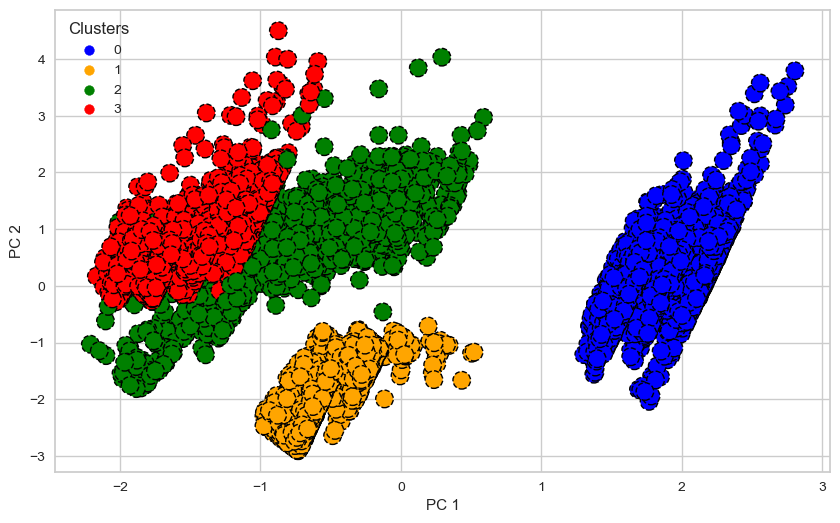

In [52]:
# Visualization of cluster distribution

pca = PCA(n_components=2)

pca.fit(rfm_scaled)
pcs = pca.transform(rfm_scaled)

data_pca = pd.DataFrame(data = pcs, columns = ['PC 1', 'PC 2'])
data_pca['Clusters'] = rfm_scaled['Cluster']
data_pca.head()

fig, ax = plt.subplots(figsize=(10,6))

sns.scatterplot(
    x="PC 1", y="PC 2",
    hue="Clusters",
    edgecolor='black',
    linestyle='--',
    data=data_pca,
    palette= ['blue', 'orange', 'green', 'red'],
    s=160,
    ax=ax
)

### B) Silhoutte Score

The Silhouette Score measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation). It ranges from -1 to 1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

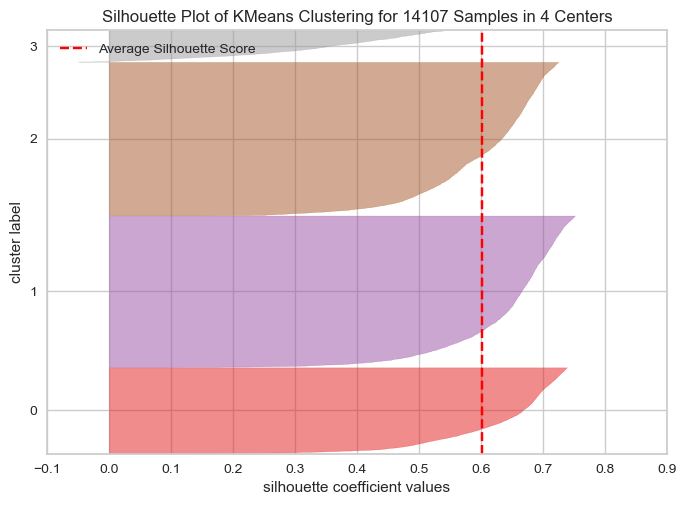

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 14107 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [53]:
# Visualize the cluster suign Silhoutte Visualizer

model = KMeans(4)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(rfm_scaled)
visualizer.show()

The image above shows that all clusters have positive coefficient values. This suggests that the model developed is very ideal.


#### Assign Cluster to Original Dataset (RFM Dataframe)

In [54]:
# Append clusters to input features table
customer['Cluster'] = cluster_labels

customer.head()

,Loyalty Number,Enrollment Year,Flights Booked,CLV,Recency,Frequency,Monetary,Cluster
0,100018,2016,157,7919.20,8,157,7919.20,3
1,100102,2013,173,2887.74,11,173,2887.74,0
2,100140,2016,152,2838.07,8,152,2838.07,3
3,100214,2015,79,4170.57,9,79,4170.57,3
4,100272,2014,127,6622.05,10,127,6622.05,0


In [55]:
customer['Cluster'].value_counts().to_frame().reset_index().rename(columns={"index": "Cluster", "Clusters": "Total Members"})

,Cluster,count
0,3,5125
1,0,5065
2,1,2877
3,2,1040


### Visualizing Customer Segments

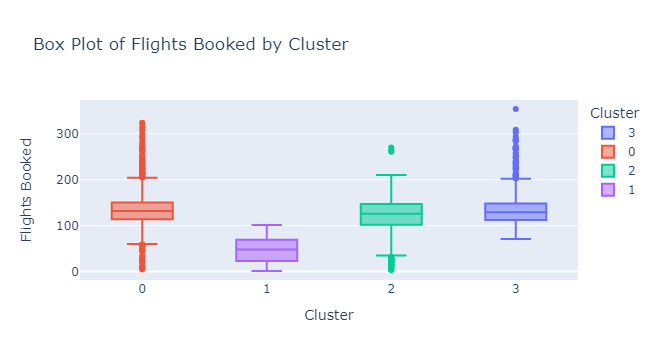

In [56]:
fig = px.box(customer, x='Cluster', y='Flights Booked', color='Cluster', title='Box Plot of Flights Booked by Cluster')
fig.show()

Based on the box plot, we found our high-value customer is at Cluster 0

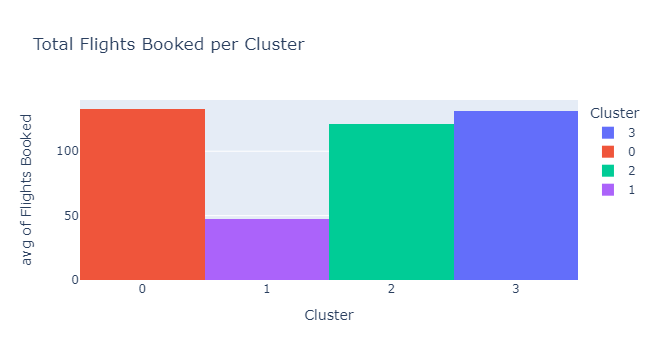

In [57]:
fig = px.histogram(customer, x='Cluster', y='Flights Booked', color='Cluster',
             title='Total Flights Booked per Cluster', histfunc='avg')

# Show the plot
fig.show()

When it comes to average of flights booked, customers is **Cluster 3** are known as Frequent Flyers.

Now let's see what's the distribution of customers in each cluster.

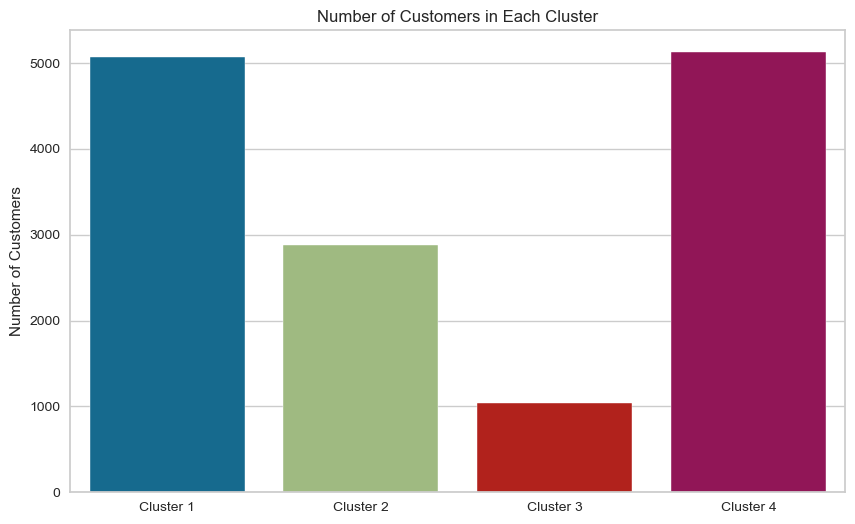

In [60]:
# Displaying number of customers in each cluster using bar chart
plt.figure(figsize=(10,6))
ax = sns.countplot(x=customer["Cluster"])
#ax.bar_label(ax.containers[0])  #to display count 
plt.xticks([0,1,2,3], ["Cluster 1", "Cluster 2", "Cluster 3", "Cluster 4"])
plt.title("Number of Customers in Each Cluster")
plt.xlabel("")
plt.ylabel("Number of Customers")
plt.show()

Based on the RFM analysis + K-Means Clustering model, we are able to identify 4 clusters of our customers, which are:

1. Cluster 1 aka **High-Value Frequent Flyers** (5,065 customers)
2. Cluster 2 aka **Occasional Flyers** (2,877 customers)
3. Cluster 3 aka **Premier Flyers** (1,040 customers)
4. Cluster 4 aka **Potential Loyal Flyers** (5,125 customers)

In [59]:
# Show the statistics of each cluster
display(customer.groupby('Cluster').agg(['min', 'max','mean','median']))

Loyalty Number                                  Enrollment Year        \
                   min     max           mean    median             min   max   
Cluster                                                                         
0               100102  999902  545043.845607  546025.0            2012  2014   
1               101547  999982  550549.058742  548638.0            2014  2018   
2               100301  999940  558123.846154  561770.5            2012  2018   
3               100018  999986  551251.962732  551300.0            2015  2018   

                             Flights Booked       ...    Recency         \
                mean  median            min  max  ...       mean median   
Cluster                                           ...                     
0        2013.085094  2013.0              4  324  ...  10.914906   11.0   
1        2017.649635  2018.0              1  101  ...   6.350365    6.0   
2        2015.103846  2015.0              3  270  ...   8.896154    9.0   
3        2016.050537  2016.0             71  354  ...   7.949463    8.0   

        Frequency                          Monetary                          \
              min  max        mean median       min       max          mean   
Cluster                                                                       
0               4  324  132.799803  132.0   1994.77  19668.87   6388.347887   
1               1  101   47.164407   48.0   1898.01  25082.18   6813.630396   
2               3  270  121.128846  126.0  15860.04  74228.52  26846.420769   
3              71  354  131.426537  129.0   1898.01  17793.61   6328.210652   

                   
           median  
Cluster            
0         5498.75  
1         5658.91  
2        24117.90  
3         5457.34  

[4 rows x 28 columns]

Cluster         | Mean Recency | Mean Frequency | Mean Monetary Value  | Segment Name
|-------------------|--------------|----------------|----------------------|----------------------|
| Cluster 0    | 10.915 months  | 132.800          |  6388.348            | High-Value Frequent Flyers
| Cluster 1           | 6.350 months | 47.164          | 6813.630         | Occasional Flyers
| Cluster 2     | 8.896 months   | 121.129          | 26846.421           | Premier Flyers
| Cluster 3 | 7.949 months  | 131.427          | 6328.211             | Potential Loyal Flyers

## 6. Summary<a name="Section6"></a>

#### About the Clusters

| Segment  Name            | Description                                                                                   |
|-------------------|---------------------------------------------------------------------------------------------------|
| High-Value Frequent Flyers   | Customers in this segment are characterized by their high frequency of flight bookings, with an average of 133 flights made within the past year. They demonstrate loyalty to the airline by frequently choosing it for their travel needs. Although their monetary value is moderate compared to other segments, their high frequency of bookings contributes significantly to their lifetime value        |
| Occasional Flyers         |  Customers in this segment are occasional travelers who have been active for a shorter period compared to other clusters. They book fewer flights on average but still contribute to the airline's revenue. With a moderate CLV, they represent an opportunity for the airline to encourage more frequent travel through targeted promotions and incentives. |
| Premier Flyers |Customers in this segment are premium flyers, booking flights approximately every 8.896 months. They exhibit a high frequency of flight bookings, with an average of 121 flights. Their monetary value, represented by the CLV, is exceptionally high, indicating significant spending and strong loyalty to the airline.  |
| Potential Loyal Flyers | Customers in this segment demonstrate a moderate recency, indicating recent engagement with the loyalty program. They exhibit a high frequency of flight bookings, similar to Cluster 0 and Cluster 2. However, their monetary value is relatively lower, suggesting a lower contribution to revenue compared to other clusters. This segment may include moderate travelers who fly frequently but spend less per transaction, such as budget-conscious travelers or those who prioritize convenience over luxury. |

### Business Recommendation

#### Cluster 0 (High-Value Frequent Customers)
This cluster comprises customers who are frequent flyers, demonstrating a high frequency of flight bookings and significant spending with the airline. They are valuable assets to the loyalty program and represent a lucrative segment for targeted initiatives.

Thus, the following business recommendations can be implemented:

1. **Priority Services and Expidited Travel**
<br> Offer priority check-in, security clearance, and baggage handling. Implement exclusive lanes for faster service and minimize their time spent at the airport.

2. **Exclusive Experiences and Rewards**
<br>Offer exclusive access to events, upgrades to premium cabins on select routes, or invitations to members-only lounges at airports. This caters to their desire for unique experiences and elevated travel.

3. **Travel Vouchers and Discounts**
<br>Provide them with exclusive vouchers or discounts on in-flight purchases (e.g., meals, entertainment) or airport retail stores. This rewards their frequent travel and elevates their onboard experience

#### Cluster 1 (Occasional Flyers)
Customers in this cluster exhibit moderate flight frequency and spending levels. While they may not book flights as frequently as Cluster 0, they still represent a valuable segment with growth potential for the loyalty program. Some business recommendations are:

1. **Weekend Getaway Packages**
<br>Create curated weekend getaway packages targeting occasional flyers, featuring discounted airfare, hotel accommodations, and activity vouchers for popular destinations to encourage spontaneous travel bookings.

2. **Targeted Deals and Flash Sales**
<br>Offer personalized discounts and flash sales on flights to their preferred destinations or during off-peak seasons. This caters to their budget-conscious approach and encourages them to book more spontaneous trips.
  
3. **Partnership Promotions**
<br>Partner with relevant brands or retailers to allow them to earn bonus points for non-travel related activities. This expands their point-earning opportunities and encourages engagement with the loyalty program.

#### Cluster 2 (Premier Flyers)
The customers in this cluster are the ones who book flights frequently and have high monetary value, indicating strong loyalty and spending. These customers prioritize a luxurious travel experience and are willing to spend more. 

Here are some business recommendations for this cluster:

1. **Complimentary Upgrades and Premium Seat Selection**
<br>Offer complimentary upgrades to premium cabins or access to premium seat selection at a discounted rate.

3. **Curated Travel Packages**
<br>Design premium travel packages tailored to their preferences, including luxury accommodations, exclusive experiences at destinations (e.g., VIP tours, gourmet dining), and personalized travel assistance.

4. **Exclusive Airport Lounge Access**
<br>Provide complimentary access to premium airport lounges where they can relax in comfort and enjoy exclusive amenities before their flights.

#### Cluster 3 (Potential Loyal Flyers)
Potential Loyal Flyers represent a segment of customers with moderate flight frequency and spending levels but have the potential for increased engagement and loyalty with the airline. Targeted initiatives can help nurture their loyalty and encourage repeat business.

Here are some of the business recommendations for this cluster:

1. **Flexible Booking Options and Seat Selection**
<br>Offer flexible booking options with easier rebooking or cancellation policies catering to their potentially unpredictable travel needs. Allow them to pre-select preferred seating types for upcoming trips, ensuring a more comfortable travel experience.

2. **Birthday and Anniversary Offers**
<br>Send personalized birthday or anniversary offers, including bonus miles or discounts for all segments. This demonstrates appreciation for their loyalty and encourages them to choose the airline for special occasions.

3. **Personalized Travel Recommendations**
<br>Leverage their travel history and preferences to suggest relevant destinations, upgrades, or travel packages. This demonstrates an understanding of their needs and elevates their travel experience.

#### For All Clusters

1. **Gamification and Reward Challenges**
<br>Design gamification elements within the loyalty program. Create challenges where they can earn points or rewards for completing specific travel-related activities (e.g., booking online, checking in early). This can incentivize engagement and make travel planning more fun.

2. **Cross-Promotional Partnerships**
<br>Establish cross-promotional partnerships with other travel-related businesses, lifestyle brands, and financial institutions to offer additional benefits, discounts, and rewards to loyalty program members, enhancing the overall value proposition and appeal of the program.

3. **Seamless Omnichannel Experience**
<br>Ensure a user-friendly mobile app, website, and airport kiosks for easy program access, account management, reward tracking, and booking with points.

4. **Travel Buddy Incentives**
<br>Implement incentives like discounts or bonus points for booking flights with companions or create a referral program where customers can earn rewards for referring new members. This encourages increased travel activity and program participation across all segments.